In [3]:
%%capture

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
%%capture
%set_random_seed 12

# Laplace Deep Neural Networks

## MLE vs Bayesian DNN classification of wines

Content:

- Create a DNN for classification and train it with Maximum Likelihood Estimation (MLE)
- Convert the DNN model to a Bayessian DNN with Pyro.
- Compare the MLE, the SVI and the Laplace approximations: metrics and calibrations
- Use the [Laplace library](https://github.com/AlexImmer/Laplace) to turn the already trained MLE DNN model into a Bayesian one using some of the Hessian approximations introduced in the theory (see "Going Bayesian through Laplace approximation" pdf).



In [5]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
import os 
import torch
import numpy as np
import pandas as pd
import pyro
import pyro.distributions as dist
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from pyro.nn import PyroSample
from pyro.infer.autoguide import (
    AutoDiagonalNormal,
    AutoLaplaceApproximation,
)
from pyro.infer import Predictive
import torch.nn as nn
from pyro.nn import PyroModule
from intro_bayesian_ml.reliability_diagrams import reliability_diagram
from laplace import Laplace

from sklearn.preprocessing import (
    OneHotEncoder,
    RobustScaler,
    LabelEncoder,
)
from IPython.core.display import display, HTML

import seaborn as sns
#import plotly.offline as pyo
import plotly.io as pio
import plotly.graph_objects as go


from intro_bayesian_ml.utilities import (
    train_dnn_model,
    get_train_test_data_loaders,
    classifier_report,
    pyro_training_with_guide,
    filter_probs_by_threshold,
)

from intro_bayesian_ml.config import (
    get_config,
    root_dir,
)

import warnings
from imblearn.over_sampling import SMOTE

warnings.filterwarnings("ignore")

/tmp/ipykernel_111650/2379040064.py:26: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [7]:
DEVICE = "cpu"  # torch.cuda.current_device()

# The wine dataset

In this exercise we want to predict the quality of the wine given a set of features like "pH", "sulphates", etc. We interpret "quality" to be a categorical variable, not a continuous one.

## Data preprocessing and visualization

We start by looking at a few data and the statistics of the dataset, then proceed to do some basic cleaning.

In [8]:
file = os.path.join("../","data","wine.csv")
df = pd.read_csv(file)
df.head(4)

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,6.2,0.20,0.25,15.0,0.055,8.0,120.0,0.99767,3.19,0.53,9.6,6
1,white,6.4,0.26,0.43,12.6,0.033,64.0,230.0,0.99740,3.08,0.38,8.9,5
2,white,6.7,0.11,0.26,14.8,0.053,44.0,95.0,0.99676,3.20,0.35,9.8,6
3,white,8.3,0.30,0.36,10.0,0.042,33.0,169.0,0.99820,3.23,0.51,9.3,6


In [9]:
TARGET = "quality"
print("Data frame info:")
df.info()

Data frame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5847 entries, 0 to 5846
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  5847 non-null   object 
 1   fixed acidity         5847 non-null   float64
 2   volatile acidity      5847 non-null   float64
 3   citric acid           5847 non-null   float64
 4   residual sugar        5847 non-null   float64
 5   chlorides             5847 non-null   float64
 6   free sulfur dioxide   5847 non-null   float64
 7   total sulfur dioxide  5847 non-null   float64
 8   density               5847 non-null   float64
 9   pH                    5847 non-null   float64
 10  sulphates             5847 non-null   float64
 11  alcohol               5847 non-null   float64
 12  quality               5847 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 594.0+ KB


We first convert categorical data to one-hot-values. This means replacing the `type` feature by two new features `red` and `white` taking binary values. Additionally, we label-encode the `TARGET` column:

In [10]:
categorical_columns = ["type"]
non_categorical_columns = set(df.columns).difference(categorical_columns)
one_hot_encoder = OneHotEncoder()
one_hot_encoded_df_features = one_hot_encoder.fit_transform(df[categorical_columns])

df = df.join(
    pd.DataFrame(
        one_hot_encoded_df_features.toarray(), columns=one_hot_encoder.categories_[0]
    )
)
df = df.drop(categorical_columns, axis=1)

label_encoder = LabelEncoder()
label_encoded_df_TARGET = label_encoder.fit_transform(df[TARGET])
df[TARGET] = pd.DataFrame(label_encoded_df_TARGET, columns=[TARGET])

df.head(4)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red,white
0,6.2,0.20,0.25,15.0,0.055,8.0,120.0,0.99767,3.19,0.53,9.6,3,0.0,1.0
1,6.4,0.26,0.43,12.6,0.033,64.0,230.0,0.99740,3.08,0.38,8.9,2,0.0,1.0
2,6.7,0.11,0.26,14.8,0.053,44.0,95.0,0.99676,3.20,0.35,9.8,3,0.0,1.0
3,8.3,0.30,0.36,10.0,0.042,33.0,169.0,0.99820,3.23,0.51,9.3,3,0.0,1.0


## Exploration of the target: class imbalance

If we look at the proportion of each label, we observe some imbalance:

In [11]:
counts = df[TARGET].value_counts().sort_index()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts, hole=0.4, sort=False)])
fig.update_layout(legend_title_text="Quality")
pio.write_html(fig, file="pie_chart.html")
display(HTML("pie_chart.html"))

To alleviate the problem, we group the target labels into three major categories:

- **Low**:0 for `quality` ∈ {0,1,2}
- **Medium**:1 for `quality` ∈ {3}
- **High**:2 for `quality` ∈ {4,5,6}

In [12]:
df[TARGET] = df.quality.apply(lambda q: 0 if q <= 2 else 1 if q < 4 else 2)

In [13]:

counts = df[TARGET].value_counts().sort_index()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts, hole=0.4, sort=False)])
fig.update_layout(legend_title_text=TARGET)
pio.write_html(fig, file="pie_chart_2.html")
display(HTML("pie_chart_2.html"))

The data is still a bit imbalanced, so in the model training section we will use [the SMOTE algorithm](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html) to balance the training data (See section 2)

## Investigation of feature correlations

From the correlation plots below we can see that:

- Many features are correlated between themselves, so we could in principle apply some feature reduction techniques. We won't do this here as the feature space is relatively small.
- Some feature distributions are skewed, so we could log transform them to normally distributed data, which will be better for our DNN model later.

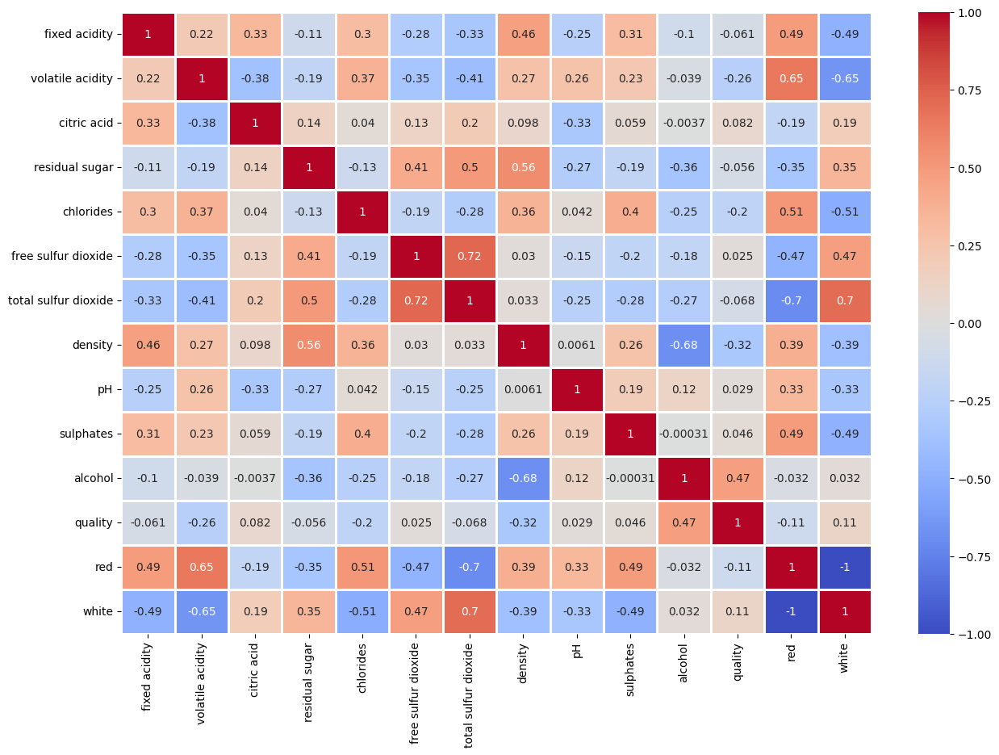

In [14]:
fig, ax = plt.subplots()
fig.set_size_inches(15, 10)
sns.heatmap(df.corr(), cmap="coolwarm", ax=ax, annot=True, linewidths=2);

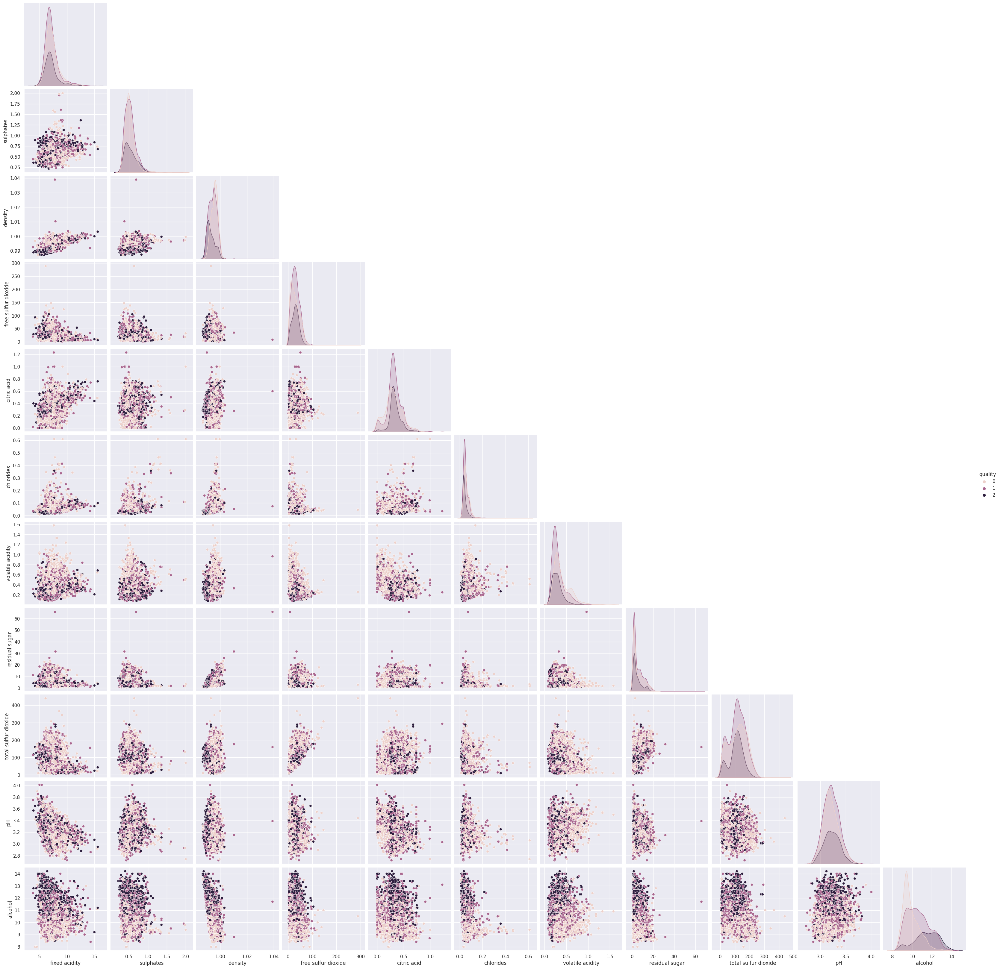

In [15]:
sns.set()
sns.pairplot(
    df[non_categorical_columns],
    height=3,
    kind="scatter",
    diag_kind="kde",
    corner=True,
    hue=TARGET,
)
plt.show()

## Reducing feature skewness

In the density estimtes of the diagonal of the plot above, we observe some features are skewed. In order to help our model, we apply a log transformation to the ones with skewness index higher than 1:

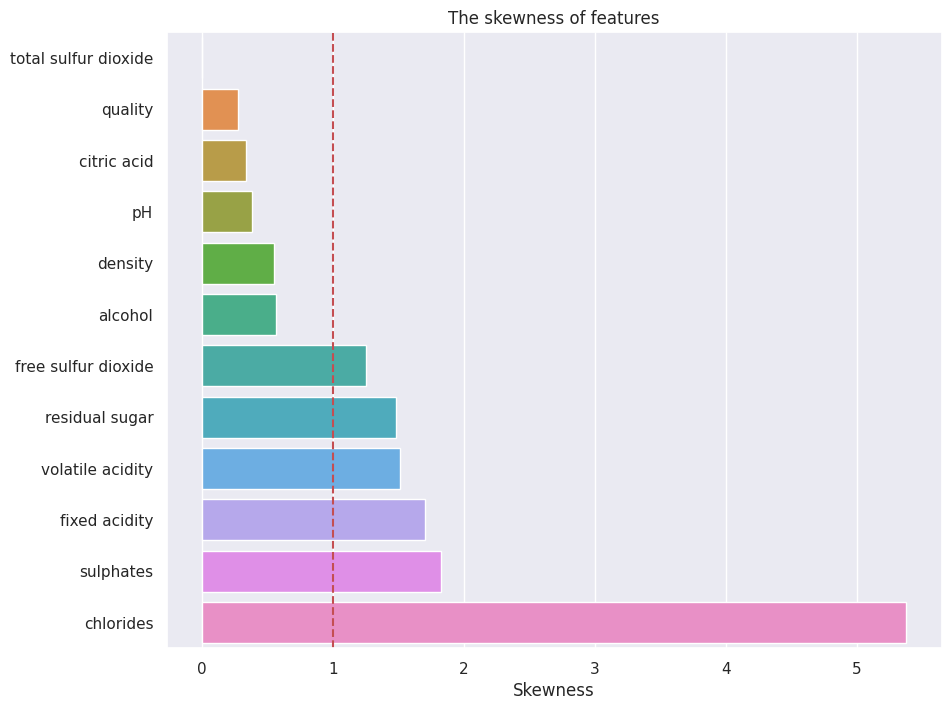

In [16]:
plt.figure(figsize=(10, 8))
skewness = df[non_categorical_columns].skew().sort_values()
sns.barplot(x=skewness, y=skewness.index).set_title("The skewness of features")
plt.axvline(x=1, color="r", linestyle="--")
plt.xlabel("Skewness");

In [17]:
skew_columns = skewness[skewness > 1].index
for col in skew_columns:
    df[col] = df[col].apply(np.log)

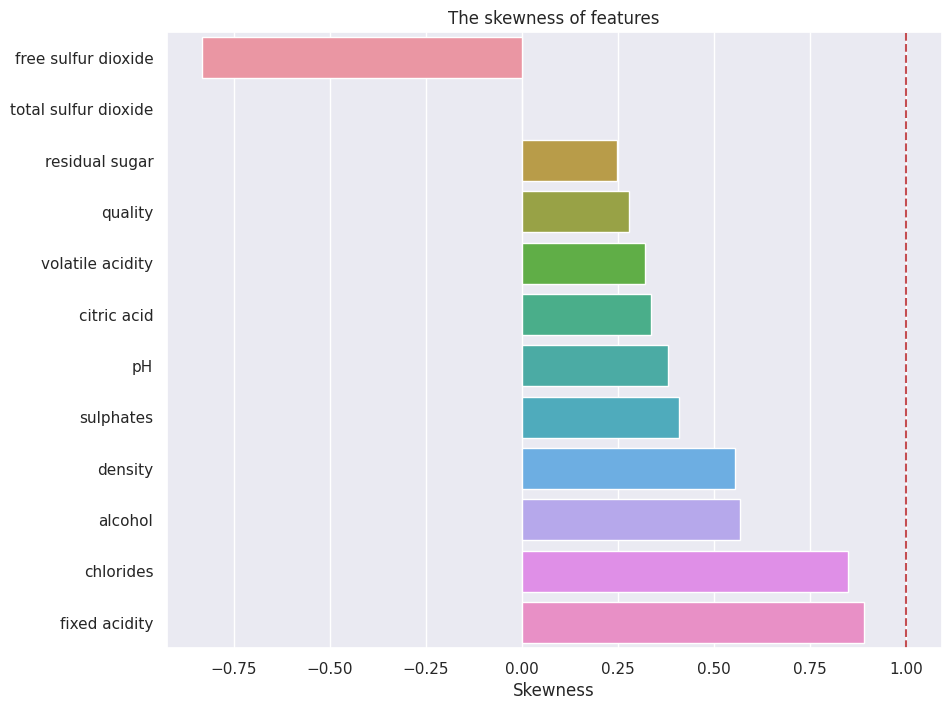

In [18]:
plt.figure(figsize=(10, 8))
skewness = df[non_categorical_columns].skew().sort_values()
sns.barplot(x=skewness, y=skewness.index).set_title("The skewness of features")
plt.axvline(x=1, color="r", linestyle="--")
plt.xlabel("Skewness");

# Approach 1: Maximum Likelihood Estimation (MLE)

We first split the data and do some preprocessing with a robust feature scaler:

In [19]:
feature_cols = [col for col in df.columns if col != TARGET]
X_train, X_test, y_train, y_test = train_test_split(
    df[feature_cols], df[TARGET], test_size=0.2, stratify=df[TARGET], random_state=43
)
scaler = RobustScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
y_train = y_train.to_numpy()
y_test = y_test.to_numpy()

As we observed before, the data is quite unbalanced, so we over sample with [SMOTE](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html) to balance the training data:

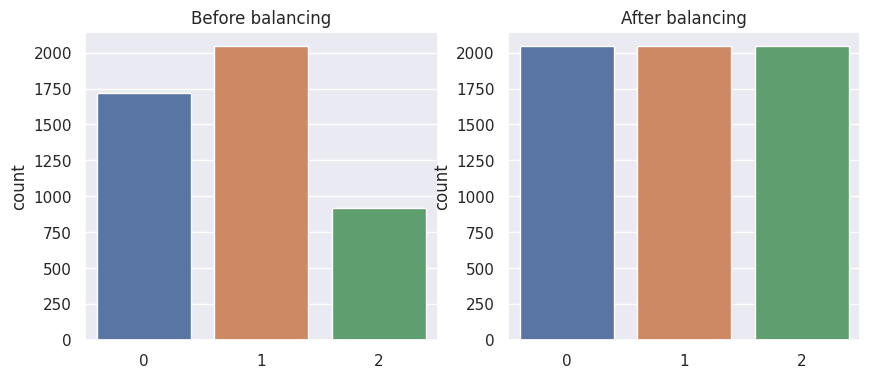

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

sns.countplot(x=y_train, ax=axes[0]).set(title="Before balancing")

sm = SMOTE(random_state=42)
X_train, y_train = sm.fit_resample(X_train, y_train)

sns.countplot(x=y_train, ax=axes[1]).set(title="After balancing");

## Data loaders

In [21]:
BATCH_SIZE = 128

train_loader, test_loader = get_train_test_data_loaders(
    X_train, X_test, y_train, y_test, BATCH_SIZE, device=DEVICE
)
print(f"Train/Test set sizes: {len(y_train)}, {len(y_test)}")

Train/Test set sizes: 6129, 1170


## Simple DNN model

We use a simple 3-layer, fully connected network with `tanh` activation:

In [22]:
class SimpleClassifier(nn.Module):
    def __init__(
        self, input_size=11, output_size=5, h1=20, h2=20, softmax=True, device=None
    ):
        """If softmax == True a softmax layer will be added to the last layer. This is
        important for the "Laplace" library (see the end of this notebook), which assumes that
        no softmax layer is added to the MLE model.
        """
        super(SimpleClassifier, self).__init__()
        self.fc1 = nn.Linear(input_size, h1, device=device)
        self.fc2 = nn.Linear(h1, h2, device=device)
        self.fc3 = nn.Linear(h2, output_size, device=device)
        self.activation = nn.Tanh()
        self.softmax_last_layer = softmax

    def forward(self, x):
        x = self.fc1(x)
        x = self.activation(x)
        x = self.fc2(x)
        x = self.activation(x)
        x = self.fc3(x)
        return torch.softmax(x, axis=1) if self.softmax_last_layer else x

## MLE training

In [23]:
num_epochs = 1000

OUTPUT_SIZE = len(np.unique(y_train))
INPUT_SIZE = X_train.shape[1]
model_MLE = SimpleClassifier(
    input_size=INPUT_SIZE, output_size=OUTPUT_SIZE, device=DEVICE
)

loss_values = train_dnn_model(
    model_MLE, train_loader, test_loader, num_epochs=num_epochs
)

Training : 100%|██████████| 1000/1000 [00:58<00:00, 17.00epoch/s, acc_test=0.598, avg_test_loss=0.949, avg_train_loss=0.797]


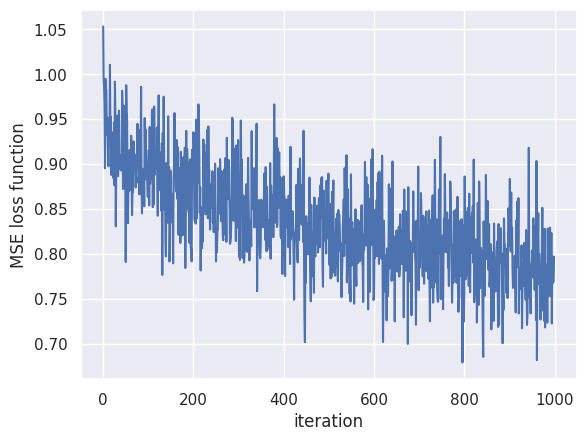

In [24]:
plt.plot(loss_values)
plt.xlabel("iteration")
plt.ylabel("MSE loss function")
plt.show()

## Classifier report

MLE classifier report

              precision    recall  f1-score   support

           0       0.70      0.69      0.70       437
           1       0.49      0.61      0.54       411
           2       0.72      0.51      0.60       322

    accuracy                           0.61      1170
   macro avg       0.64      0.60      0.61      1170
weighted avg       0.63      0.61      0.62      1170



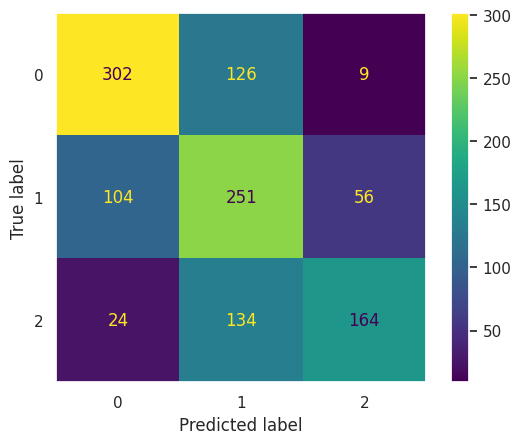

In [25]:
predicted_MLE_probs, predicted_MLE_labels = torch.max(
    model_MLE(torch.FloatTensor(X_test).to(DEVICE)), axis=1
)
predicted_MLE_labels = predicted_MLE_labels.cpu().numpy()
predicted_MLE_probs = predicted_MLE_probs.detach().cpu().numpy()
classifier_report(predicted_MLE_labels, y_test, "MLE classifier report")

## Classifier calibration

When using a classifier to make decisions with associated costs (e.g. in which of three price ranges to sell a given batch of wine), one typically wants to minimise the expected cost over all decisions, which is an average weighted by class probabilities. In other words, if one has a cost function $C(i,j,x)$ with the cost of classifying $x$ as class $i$, when in fact it belongs to class $j$, then the optimal classification of sample $x$ is the class $y^\star$ minimising

$$\sum_{j} p(Y=j | X=x) C(y^\star, j, x).$$

Because the decision maker does not have access to the conditional distribution $p(Y|X)$, the predictions of the classifier are taken instead in order to minimise the expected cost. Now, if the classifier is wrong about the probabilities (even if it is reasonably correct in which class is most probable), the minimisation will lead to suboptimal decisions. We say that a classifier $f$ is **strongly calibrated** if its confidence in each prediction reflects true probabilities, i.e. if

$$p(Y = i | f(x) = c) = c_i.$$

The closer $f$ is to strong calibration, the closer the predictive distribution will be from the true conditional $p(Y|X)$. An interesting consequence of using a Bayesian approach to training that we will encounter, is that the resulting model will be better calibrated. To see this, we first look at the MLE model:


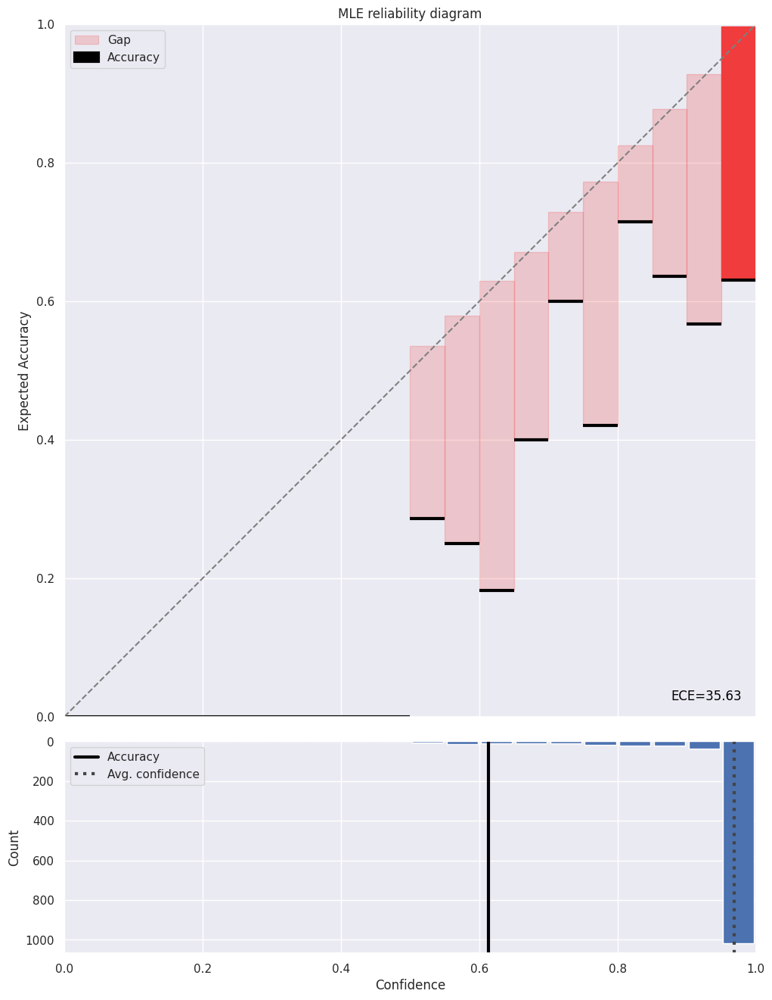

In [26]:
fig = reliability_diagram(
    y_test,
    predicted_MLE_labels,
    predicted_MLE_probs,
    num_bins=20,
    draw_ece=True,
    draw_bin_importance="alpha",
    draw_averages=True,
    figsize=(10, 10),
    dpi=100,
    return_fig=True,
    title="MLE reliability diagram",
)

# Approach 2: Bayesian training with Pyro

In this section, **we will explore how to convert our previous DNN into a Bayesian one using Stochastic Variational Inference (SVI) and Laplace approximation in Pyro**.

> **Note 1**: The downside of SVI is that we will need to retrain the DNN by maximizing the ELBO. However, as we will see, SVI produces a much better-calibrated model, as expected from a Bayesian approach.

> **Note 2**: Pyro is a library specialized in SVI, and it performs **Laplace approximation** by using it as the ansatz distribution. It then applies the ELBO for SVI. Generally, this is not necessary, as we **can directly reuse the MLE model, making this method quite powerful. For instance, you can take a large pretrained model (e.g., AlexNet) and apply Laplace approximation only to the last layer**. This will be demonstrated later using the [LAPLACE](https://github.com/AlexImmer/Laplace) library, a collaboration between the University of Cambridge, MPI for Intelligent Systems (Tübingen), ETH Zurich, and DeepMind.

## Switching to a Bayesian model

**Convert the previous DNN model to a Bayesian one**

This is very intuitive to do with Pyro. First you need to make the layer weights probabilistic. Suppose you have 
a linear layer, let's say:

```python
layer_1 = nn.Linear(input_size, output_size)
```

The way to make it probabilistic is the following:

```python
layer_1 = PyroModule[nn.Linear](input_size, output_size)
layer_1.weight = PyroSample(dist.Normal(0., 1.).expand([output_size, input_size]).to_event(2)
layer_1.bias = PyroSample(dist.Normal(0., 1.).expand([output_size]).to_event(1)
```

Comments:

- `PyroModule` is very similar to PyTorch’s `nn.Module`, but additionally supports Pyro primitives as attributes that can be modified by Pyro’s effect handlers.

-  `PyroSample` is very similar to `pyro.sample` but it has to be used in the context of pytorch models as it needs to access to the model parameters.

- `to_event(1)` and `to_event(2)` implies that we are sampling from a univariate and a bivariate distribution respectively.

- `expand([output_size, input_size])` is used to draw a batch of samples.

In [ ]:
class BayesianDNNRegression(PyroModule):
    def __init__(self, input_size=11, output_size=5, h1=20, h2=20, device=None):
        super().__init__()
        prior_loc = torch.tensor(0.0).to(device)
        prior_scale = torch.tensor(1.0).to(device)

        self.fc1 = PyroModule[nn.Linear](input_size, h1, device=device)
        self.fc1.weight = PyroSample(
            dist.Normal(prior_loc, prior_scale).expand((h1, input_size)).to_event(2)
        )
        self.fc1.bias = PyroSample(
            dist.Normal(prior_loc, prior_scale).expand((h1,)).to_event(1)
        )

        self.fc2 = PyroModule[nn.Linear](h1, h2, device=device)
        self.fc2.weight = PyroSample(
            dist.Normal(prior_loc, prior_scale).expand((h2, h1)).to_event(2)
        )
        self.fc2.bias = PyroSample(
            dist.Normal(prior_loc, prior_scale).expand((h2,)).to_event(1)
        )

        self.fc3 = PyroModule[nn.Linear](h2, output_size, device=device)
        self.fc3.weight = PyroSample(
            dist.Normal(prior_loc, prior_scale).expand((output_size, h2)).to_event(2)
        )
        self.fc3.bias = PyroSample(
            dist.Normal(prior_loc, prior_scale).expand((output_size,)).to_event(1)
        )

        self.activation = nn.Tanh().to(device)

    def forward(self, x_in, y=None):
        x = self.fc1(x_in)
        x = self.activation(x)
        x = self.fc2(x)
        x = self.activation(x)
        x = self.fc3(x)
        x = torch.softmax(x, axis=1)
        mu = x.squeeze()

        # if y is not None:
        #    y = y.type(torch.LongTensor).squeeze()
        #    y = torch.nn.functional.one_hot(torch.LongTensor(y), num_classes=7)

        # print(dist.OneHotCategorical(probs=mu).sample())
        with pyro.plate("data", len(x_in)):
            # obs = pyro.sample("obs", dist.MultivariateNormal(mu, sigma_mat), obs=y)
            obs = pyro.sample("obs", dist.OneHotCategorical(probs=mu), obs=y)
        return mu

## Posterior approximations with SVI and Laplace

In [28]:
# Model and guide for SVI posterior approximation
model_svi = BayesianDNNRegression(
    input_size=INPUT_SIZE, output_size=OUTPUT_SIZE, h1=20, h2=20, device=DEVICE
)
guide_svi = AutoDiagonalNormal(model_svi)

adam = pyro.optim.Adam({"lr": 1e-3})

### SVI approximation -- ELBO maximization

In [29]:
num_epochs = 300

elbo_svi = pyro_training_with_guide(
    model_svi, guide_svi, adam, train_loader, num_epochs=num_epochs, device=DEVICE
)

Training: 100%|██████████| 300/300 [01:31<00:00,  3.29epoch/s, loss=1.795]

Done in: 91.29 s


### Laplace approximation (simple Pyro implementation)

In [30]:
model_laplace = BayesianDNNRegression(
    input_size=INPUT_SIZE, output_size=OUTPUT_SIZE, h1=20, h2=20, device=DEVICE
)
guide_laplace = AutoLaplaceApproximation(model_laplace)

In [31]:
loss_laplace = pyro_training_with_guide(
    model_laplace,
    guide_laplace,
    adam,
    train_loader,
    num_epochs=num_epochs,
    device=DEVICE,
)

Training: 100%|██████████| 300/300 [01:20<00:00,  3.72epoch/s, loss=7.107]

Done in: 80.57 s


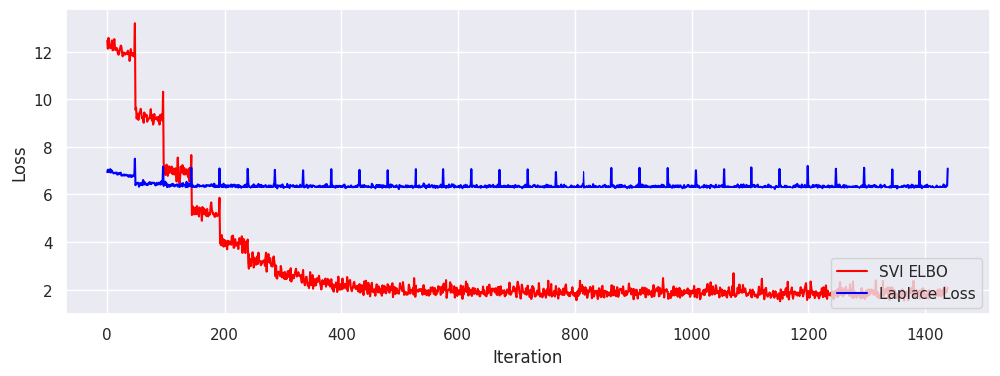

In [32]:
plt.figure(figsize=(12, 4))
plt.plot(elbo_svi, color="red", label="SVI ELBO")
plt.plot(loss_laplace, color="blue", label="Laplace Loss")
plt.legend(loc="lower right")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.show()

## Compute predictions

### Exercise

**Compute the SVI and Laplace model predictions**

In [46]:
# Number of models to be sampled from the posterior P(w|D)
num_samples = 400

guide_svi.requires_grad_(False)
predictive_svi = Predictive(model_svi, guide=guide_svi, num_samples=num_samples)

guide_laplace.requires_grad_(False)
predictive_laplace = Predictive(
    model_laplace, guide=guide_laplace, num_samples=num_samples
)
# torch.sum(torch.argmax(torch.mean(preds_svi_test, axis=0), axis=1) == y_test_ts)/len(y_test_ts)

In [34]:
labels = y_test

predictive_svi_fit = predictive_svi(torch.FloatTensor(X_test).to(DEVICE))
predictive_svi_samples = predictive_svi_fit["obs"].detach()
predicted_svi_probs, predicted_svi_labels = torch.max(
    torch.mean(predictive_svi_samples, axis=0), axis=1
)
predicted_svi_probs = predicted_svi_probs.cpu().numpy()
predicted_svi_labels = predicted_svi_labels.cpu().numpy()

In [35]:
predictive_laplace_fit = predictive_laplace(torch.FloatTensor(X_test).to(DEVICE))
predictive_laplace_samples = predictive_laplace_fit["obs"].detach()
predicted_laplace_probs, predicted_laplace_labels = torch.max(
    torch.mean(predictive_laplace_samples, axis=0), axis=1
)
predicted_laplace_probs = predicted_laplace_probs.cpu().numpy()
predicted_laplace_labels = predicted_laplace_labels.cpu().numpy()

## Classifier reports

Laplace Classifier

              precision    recall  f1-score   support

           0       0.74      0.66      0.70       481
           1       0.38      0.59      0.46       329
           2       0.77      0.49      0.60       360

    accuracy                           0.59      1170
   macro avg       0.63      0.58      0.59      1170
weighted avg       0.65      0.59      0.60      1170



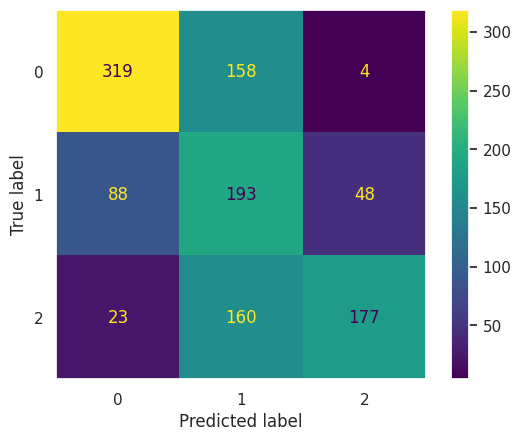

In [36]:
classifier_report(predicted_laplace_labels, y_test, "Laplace Classifier")

SVI Classifier

              precision    recall  f1-score   support

           0       0.37      0.39      0.38       415
           1       0.21      0.43      0.28       250
           2       0.57      0.26      0.35       505

    accuracy                           0.34      1170
   macro avg       0.38      0.36      0.34      1170
weighted avg       0.42      0.34      0.35      1170



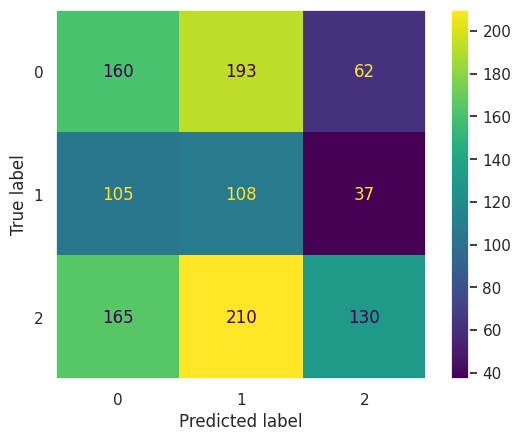

In [37]:
classifier_report(predicted_svi_labels, y_test, "SVI Classifier")

### Calibration

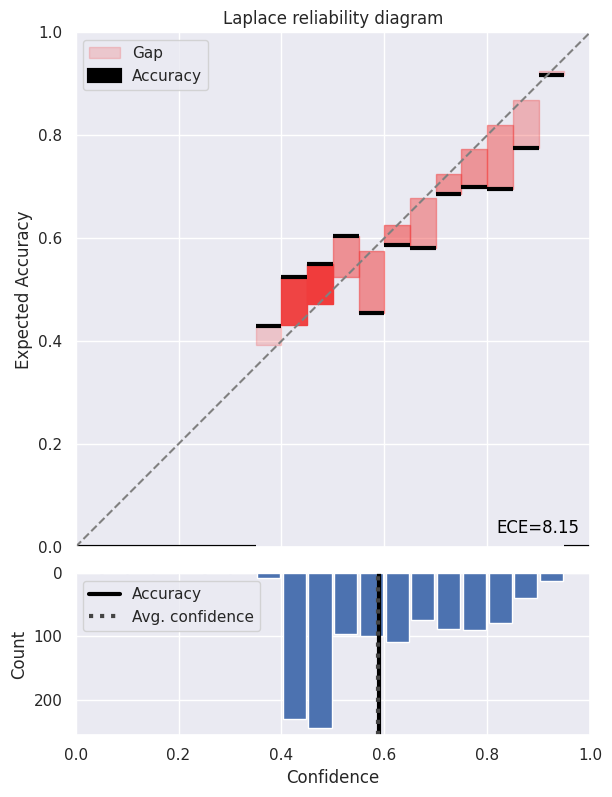

In [38]:
fig = reliability_diagram(
    labels,
    predicted_laplace_labels,
    predicted_laplace_probs,
    num_bins=20,
    draw_ece=True,
    draw_bin_importance="alpha",
    draw_averages=True,
    figsize=(6, 6),
    dpi=100,
    return_fig=True,
    title="Laplace reliability diagram",
)

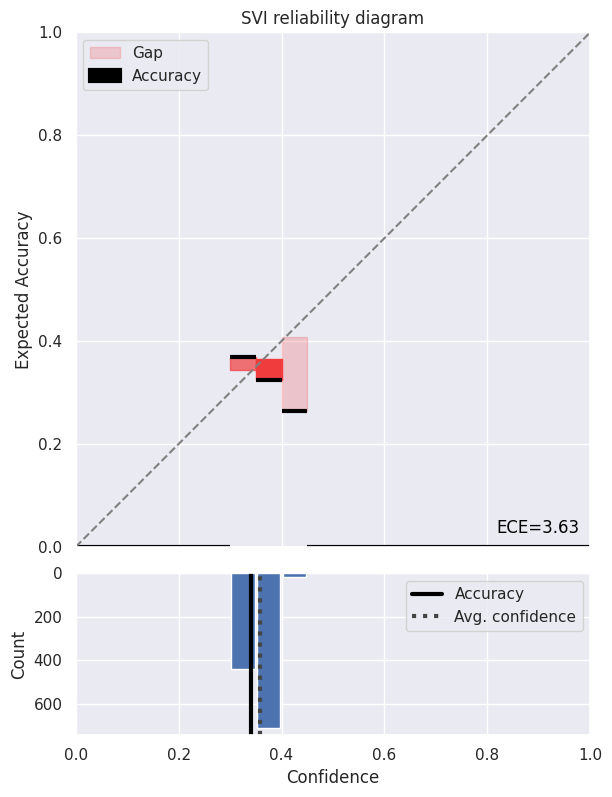

In [39]:
fig = reliability_diagram(
    labels,
    predicted_svi_labels,
    predicted_svi_probs,
    num_bins=20,
    draw_ece=True,
    draw_bin_importance="alpha",
    draw_averages=True,
    figsize=(6, 6),
    dpi=100,
    return_fig=True,
    title="SVI reliability diagram",
)

The MLE has better metrics than SVI and Laplace but poor calibration. Instead, the SVI and Laplace method are much better calibrated as expected from a Bayesian approach. As we will see in the last section of this notebook, by using the LAPLACE library (that does a Laplace approximation around the MLE model and implements all the Hessian approximations explained in the theory) we will have the best of both worlds, i.e. metrics very close to the MLE model and a well calibrated model as expected from a Bayesian approach and almost for free!! Note also that SVI is not doing a good job for target 1 as the precision is quite bad and one reason could be the simple guide approximation that cannot capture the complexity of our posterior. So Laplace is always another good choice for posterior approximations in real world problems.

### Summary:

**As you can see, SVI makes the model probabilistic, but you will need to retrain the model through ELBO maximization**. We used a very simple ansatz function for SVI (a Gaussian with a diagonal covariance matrix), so the calibration is much better than that of MLE, but it could be further improved with a more sophisticated ansatz.

**Laplace, on the other hand, allows you to reuse your trained machine learning model and generally provides a cost-effective and robust Bayesian model**. This is evident in the Laplace Reliability Diagram. Notice that the model is again much better calibrated than the one from MLE, with better-distributed probabilities, as shown in the Laplace confidence plot. Remember that the ansaty in Laplace is much better than a simple Gaussian with a diagonal covariance as the one we used in the SVI as the covariance of Laplace is related to the Hessian and so it contains very useful information about the curvature of the underlying probability distribution.

> **Note: Remember that the ansatz in Laplace is more sophisticated than a simple Gaussian with a diagonal covariance, like the one used in SVI, as the covariance in Laplace is related to the Hessian, containing valuable information about the curvature of the underlying probability distribution.**

## Aside: a small performance improvement

Now that we have a better calibrated model i.e. with more realistic probabilities we can use them to make better predictions. For instance, we could be interested only in the wine predictions over a certain threshold. Let's use only the Laplace method here that seems to be a bit better than SVI.

old size vs new size: 1170, 592
Laplace-model with higher confidence

              precision    recall  f1-score   support

           0       0.96      0.69      0.80       352
           1       0.00      0.00      0.00         0
           2       0.98      0.54      0.69       240

    accuracy                           0.63       592
   macro avg       0.64      0.41      0.50       592
weighted avg       0.97      0.63      0.76       592



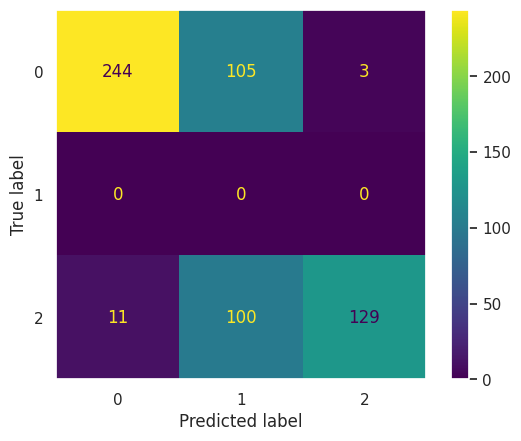

In [40]:
threshold_prob = 0.55

new_laplace_labels, new_laplace_predicted_labels = filter_probs_by_threshold(
    labels,
    predicted_laplace_labels,
    predicted_laplace_probs,
    threshold_prob=threshold_prob,
)
print(f"old size vs new size: {len(labels)}, {len(new_laplace_labels)}")

classifier_report(
    new_laplace_predicted_labels,
    new_laplace_labels,
    "Laplace-model with higher confidence",
)

Note that we have a slight improvement on the metrics!!

# Approach 3: Bayesian training with LAPLACE and Hessian approximations

Let's make the last layer of our MLE model Bayesian by using the library [LAPLACE](https://github.com/AlexImmer/Laplace). We also approximate the Hessian with the Kronecker approximation explained in the theory.

In [41]:
model_MLE.softmax_last_layer = False  # Important! Deactivate the softmax
net_laplace = Laplace(
    model_MLE,
    "classification",
    subset_of_weights="all",
    hessian_structure="kron",
)

In [42]:
# model fitting
net_laplace.fit(train_loader)
net_laplace.optimize_prior_precision(method="gridsearch", lr=0.1, val_loader=test_loader)
#net_laplace.optimize_prior_precision(method="CV", lr=0.01, val_loader=test_loader)

In [43]:
# Use probit (see theory) and get predictions
pred = net_laplace(torch.FloatTensor(X_test), link_approx="probit")
labels = y_test
predicted_laplace2_probs, predicted_laplace2_labels = torch.max(pred, axis=1)
predicted_laplace2_labels = predicted_laplace2_labels.numpy()
predicted_laplace2_probs = predicted_laplace2_probs.numpy()

## Calibration

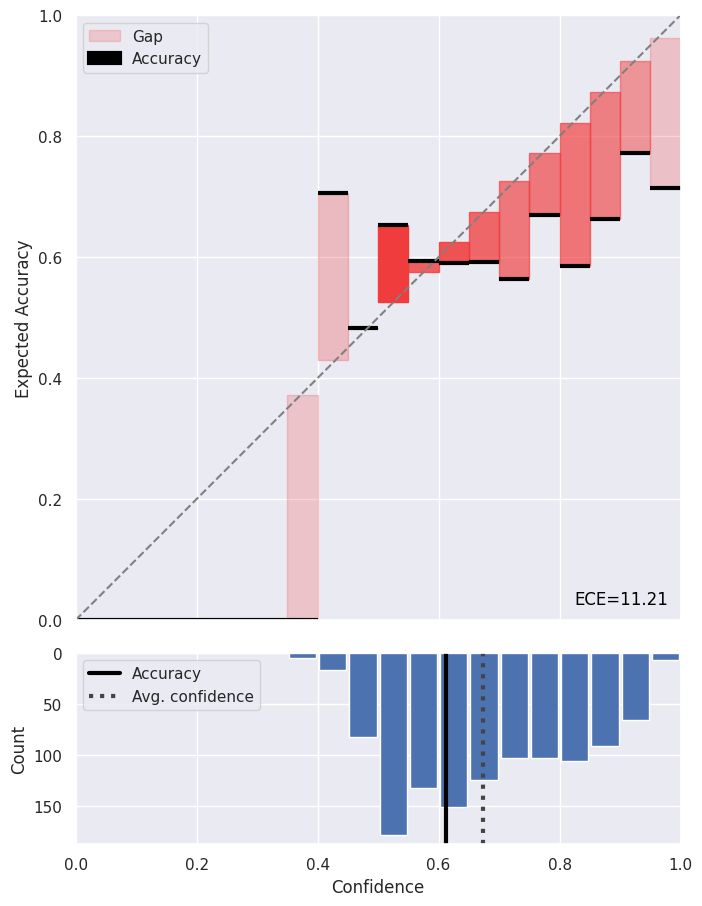

In [44]:
fig = reliability_diagram(
    labels,
    predicted_laplace2_labels,
    predicted_laplace2_probs,
    num_bins=20,
    draw_ece=True,
    draw_bin_importance="alpha",
    draw_averages=True,
    title="",
    figsize=(7, 6),
    dpi=100,
    return_fig=True,
)

Laplace-model with Hessian approximation

              precision    recall  f1-score   support

           0       0.70      0.69      0.70       437
           1       0.49      0.61      0.54       411
           2       0.72      0.51      0.60       322

    accuracy                           0.61      1170
   macro avg       0.64      0.60      0.61      1170
weighted avg       0.63      0.61      0.62      1170



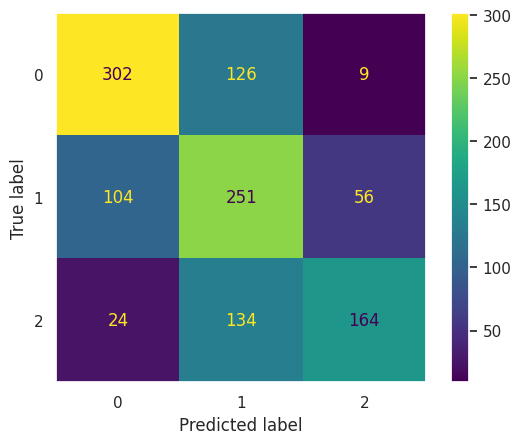

In [45]:
classifier_report(
    predicted_laplace2_labels, y_test, "Laplace-model with Hessian approximation"
)

>**Note: we have the same metrics that we got for the MLE DNN but with a much better calibrated classifier, so that we have the best of both approaches.**

>**The LAPLACE library is quite good for transfer learning as you can import a DNN like AlexNet for classification, do some transfer learning for your dataset and apply LAPLACE to make it Bayesian. This is not an option with Pyro as with SVI you will need to train your AlexNet from scratch by ELBO maximization, and the Laplace method in Pyro just computes the Hessian of the posterior that without any of the transformations introduced in the theory, is intractable.**
